#Problem: Online Shoppers intention

Approach:



**Data Source**

[https://www.kaggle.com/roshansharma/online-shoppers-intention]

C. Okan Sakar
Department of Computer Engineering, Faculty of
Engineering and Natural Sciences, Bahcesehir University,
34349 Besiktas, Istanbul, Turkey
Yomi Kastro
Inveon Information Technologies Consultancy and Trade,
34335 Istanbul, Turkey
Data Set Information:
The dataset consists of feature vectors belonging to 12,330 sessions.
The dataset was formed so that each session
would belong to a different user in a 1-year period to avoid
any tendency to a specific campaign, special day, user
profile, or period.

Attribute Information:
The dataset consists of 10 numerical and 8 categorical attributes.
The 'Revenue' attribute can be used as the class label.
"Administrative", "Administrative Duration", "Informational", "Informational Duration", "Product Related" and "Product Related Duration" represent the number of different types of pages visited by the visitor in that session and total time spent in each of these page categories. The values of these features are derived from the URL information of the pages visited by the user and updated in real time when a user takes an action, e.g. moving from one page to another. The "Bounce Rate", "Exit Rate" and "Page Value" features represent the metrics measured by "Google Analytics" for each page in the e-commerce site. The value of "Bounce Rate" feature for a web page refers to the percentage of visitors who enter the site from that page and then leave ("bounce") without triggering any other requests to the analytics server during that session. The value of "Exit Rate" feature for a specific web page is calculated as for all pageviews to the page, the percentage that were the last in the session. The "Page Value" feature represents the average value for a web page that a user visited before completing an e-commerce transaction. The "Special Day" feature indicates the closeness of the site visiting time to a specific special day (e.g. Mother’s Day, Valentine's Day) in which the sessions are more likely to be finalized with transaction. The value of this attribute is determined by considering the dynamics of e-commerce such as the duration between the order date and delivery date. For example, for Valentina’s day, this value takes a nonzero value between February 2 and February 12, zero before and after this date unless it is close to another special day, and its maximum value of 1 on February 8. The dataset also includes operating system, browser, region, traffic type, visitor type as returning or new visitor, a Boolean value indicating whether the date of the visit is weekend, and month of the year.

Relevant Papers:
Sakar, C.O., Polat, S.O., Katircioglu, M. et al. Neural Comput & Applic (2018)

In [1]:
#import generic and useful packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline


from google.colab import files

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [3]:
dataset = files.upload()

Saving online_shoppers_intention.csv to online_shoppers_intention.csv


In [2]:
df = pd.read_csv('online_shoppers_intention.csv')
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0.0,-1.0,0.0,-1.0,1.0,-1.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [5]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12316.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.317798,80.906176,0.503979,34.506387,31.763884,1196.037057,0.022152,0.043003,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.322754,176.860432,1.270701,140.825479,44.490339,1914.372511,0.048427,0.048527,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,-1.000000,0.000000,-1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,185.000000,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,8.000000,0.000000,0.000000,18.000000,599.766190,0.003119,0.025124,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.500000,0.000000,0.000000,38.000000,1466.479902,0.016684,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [6]:
df.dtypes

Administrative             float64
Administrative_Duration    float64
Informational              float64
Informational_Duration     float64
ProductRelated             float64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                       bool
dtype: object

In [7]:
!pip uninstall pandas-profiling -y

Uninstalling pandas-profiling-1.4.1:
  Successfully uninstalled pandas-profiling-1.4.1


In [8]:
!pip install pandas-profiling==2.8.0

     |████████████████████████████████| 266kB 2.7MB/s 
     |████████████████████████████████| 61kB 6.0MB/s 
     |████████████████████████████████| 604kB 8.5MB/s 
     |████████████████████████████████| 3.1MB 15.6MB/s 
     |████████████████████████████████| 71kB 9.1MB/s 
     |████████████████████████████████| 296kB 29.6MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-cp36-none-any.whl size=27084 sha256=b222b1fdfaaf29e595c7f68c68d21db4531334c61c34592df360c7afbd07bbf2
  Stored in directory: /root/.cache/pip/wheels/43/07/ac/7c5a9d708d65247ac1f94066cf1db075540b85716c30255459
  Created wheel for confuse: filename=confuse-1.1.0-cp36-none-any.whl size=17574 sha256=03eff464478a60e039680311f8feab26c6db5b0124dd239b57c3f5b3893b3d11
  Stored in directory: /root/.cache/pip/wheels/f6/8b/23/41a1b516f6d8d4cc81f5bdb55394a47cdbe9659c53668d3c9e
  Created wheel for imagehash: filename=ImageHash-4.1.0-py2.py3-none-any.whl size=291990 sha256=535feed655a59a69d357e24c537b84079d349dc49f9b575c1cd32

In [0]:
from pandas_profiling import ProfileReport

In [0]:
profile= ProfileReport(df, explorative= True)

In [5]:
profile

In [0]:
#
df= df.dropna()

In [9]:
#clean data
#

df.isna().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [10]:
df.shape

(12316, 18)

In [0]:
#Drop all negative duration in dataset

df=df.drop(df[df['Administrative_Duration'] < 0].index)
df=df.drop(df[df['Informational_Duration']<0].index)
df=df.drop(df[df['ProductRelated_Duration']<0].index)

In [36]:
df

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,True,False
5,0.0,0.0,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.000000,0.0,Feb,2,2,1,3,Returning_Visitor,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,True,False
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,True,False
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,True,False
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,False,False


Visualization and analysis for understanding dataset




In [0]:
#To understand customers intention, we need to find patterns by 
#1) clustering them into groups
#2) find features correlation wrt 1) revenue 2) bounce rate 3) exitrates
#3) find effect of page value on customers too revenue
#4) Also, visualize months wrt 1) revenue 2) bounce rate 3} exitrates
#5) Does Operating System used have an effect on 1) revenue 2) bounce rate 3} exitrates
#6) Does Browser used have an effect on 1) revenue 2) bounce rate 3} exitrate
#7) Rank region based on 1) revenue 2) bounce rate 3} exit rate
#8) Effect of weekend on 1) revenue 2) bounce rate 3} exit rate
#9) Effect of visitortype on 1) revenue 2) bounce rate 3} exit rate
#10) Finally, Predict revenue based off....  using several categorical ML models and DL:  logistics, SVM, RF, XGBoost, and NN 

In [13]:
df.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'Revenue'],
      dtype='object')

Text(0.5, 1.0, 'OperatingSystem_Proportion')

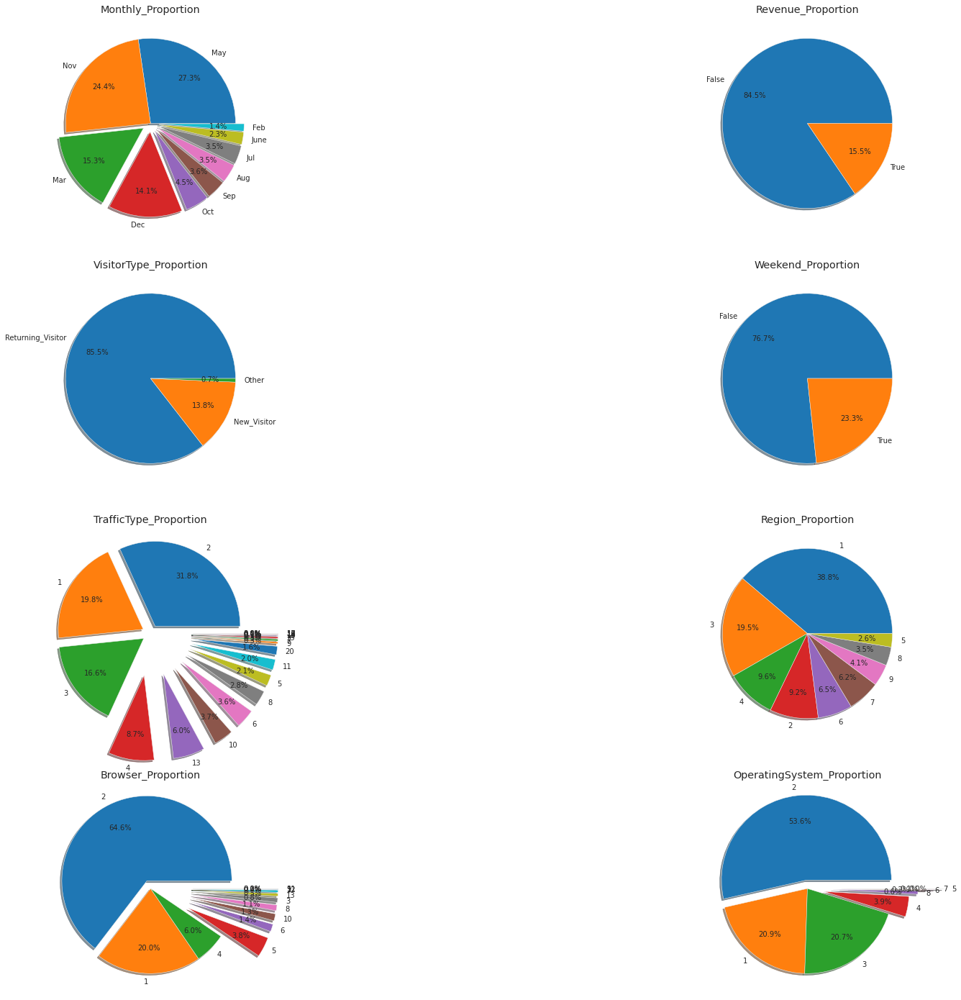

In [83]:
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(30,25))

axs[0,1].pie((df['Revenue'].value_counts()), labels=('False', 'True'), autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[0,0].pie(df['Month'].value_counts(), labels= df['Month'].value_counts().index, autopct= '%1.1f%%', pctdistance= 0.7, explode=(0,0,0.1,0.1,0.1,0.1,0.1,0.1,0.1,0.1), shadow= True)
axs[1,1].pie((df['Weekend'].value_counts()), labels=('False', 'True'), autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[1,0].pie((df['VisitorType'].value_counts()), labels=df['VisitorType'].value_counts().index, autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[2,0].pie((df['TrafficType'].value_counts()), labels=df['TrafficType'].value_counts().index, explode=(0.1,0.1,0.1,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5), autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[2,1].pie((df['Region'].value_counts()), labels=df['Region'].value_counts().index, autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[3,0].pie((df['Browser'].value_counts()), labels=df['Browser'].value_counts().index, explode=(0.1,0,0,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5,0.5), autopct='%1.1f%%', shadow=True, pctdistance=0.7)
axs[3,1].pie((df['OperatingSystems'].value_counts()), labels=df['OperatingSystems'].value_counts().index, explode=(0.1,0,0,0.2,0.3,0.4,0.5,0.6), autopct='%1.1f%%', shadow=True, pctdistance=0.7)



axs[0,1].set_title('Revenue_Proportion')
axs[0,0].set_title('Monthly_Proportion')
axs[1,1].set_title('Weekend_Proportion')
axs[1,0].set_title('VisitorType_Proportion')
axs[2,0].set_title('TrafficType_Proportion')
axs[2,1].set_title('Region_Proportion')
axs[3,0].set_title('Browser_Proportion')
axs[3,1].set_title('OperatingSystem_Proportion')


In [89]:
#Now let's see the correlation of all features with each other
df.corr().style.background_gradient(cmap='coolwarm')

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType,Weekend,Revenue
Administrative,1.000000,0.601171,0.376374,0.255479,0.430116,0.372935,-0.221188,-0.314919,0.098267,-0.095300,-0.006594,-0.025055,-0.005385,-0.034072,0.025780,0.137970
Administrative_Duration,0.601171,1.000000,0.302304,0.237734,0.288277,0.354749,-0.142435,-0.204583,0.067096,-0.073636,-0.007523,-0.015399,-0.005517,-0.014680,0.014586,0.092911
Informational,0.376374,0.302304,1.000000,0.618880,0.373680,0.387065,-0.114485,-0.162471,0.048217,-0.048448,-0.009522,-0.038197,-0.029341,-0.034704,0.035234,0.094672
Informational_Duration,0.255479,0.237734,0.618880,1.000000,0.279701,0.347088,-0.073064,-0.104530,0.030579,-0.030731,-0.009656,-0.019296,-0.027190,-0.024855,0.023847,0.069984
ProductRelated,0.430116,0.288277,0.373680,0.279701,1.000000,0.860711,-0.201828,-0.290579,0.055521,-0.024348,0.004071,-0.013122,-0.038137,-0.043569,0.015496,0.157624
ProductRelated_Duration,0.372935,0.354749,0.387065,0.347088,0.860711,1.000000,-0.181990,-0.249958,0.052124,-0.036757,0.002773,-0.007352,-0.033093,-0.036831,0.006739,0.151528
BounceRates,-0.221188,-0.142435,-0.114485,-0.073064,-0.201828,-0.181990,1.000000,0.911252,-0.118532,0.074726,0.025334,-0.017798,-0.008184,0.081602,-0.044896,-0.149348
ExitRates,-0.314919,-0.204583,-0.162471,-0.104530,-0.290579,-0.249958,0.911252,1.000000,-0.174110,0.104718,0.015734,-0.005722,-0.010122,0.081245,-0.061203,-0.206145
PageValues,0.098267,0.067096,0.048217,0.030579,0.055521,0.052124,-0.118532,-0.174110,1.000000,-0.063777,0.018430,0.045707,0.011370,0.012369,0.011718,0.492317
SpecialDay,-0.095300,-0.073636,-0.048448,-0.030731,-0.024348,-0.036757,0.074726,0.104718,-0.063777,1.000000,0.012127,0.003472,-0.015864,0.052496,-0.016738,-0.082632


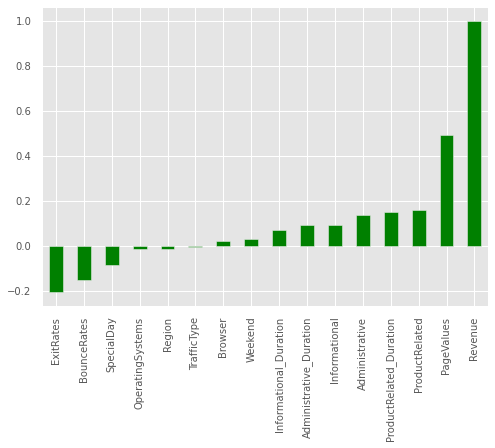

In [103]:
#Looking through the grids, we observe some significant points
#*PageValue has the highest correlation with Revenue
#*Also unsuprisinly, bounce rate and exit rate have max negative correlation to Revenue  
#Let's have a better vizualiztion of each feature wrt to Revenue
 

df.corr()['Revenue'].sort_values().plot(kind='bar', color= 'green')

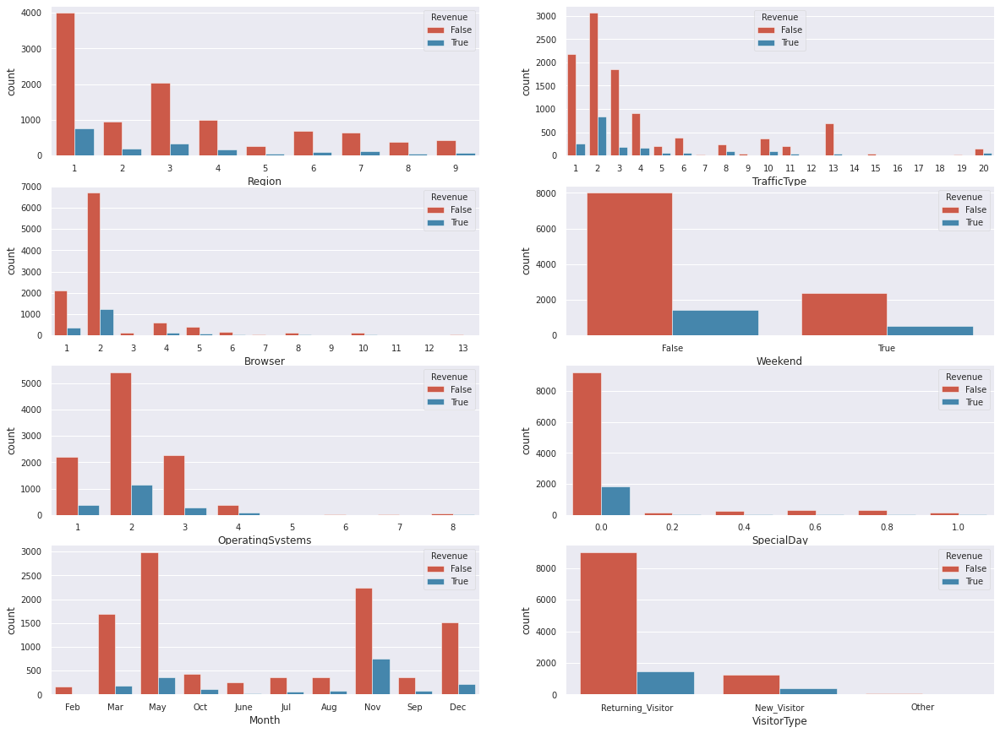

In [144]:
fig, axss=plt.subplots(nrows =4, ncols=2, figsize=(20,15))

sns.countplot(x='Region', data=df, hue='Revenue', ax=axss[0,0])
sns.countplot(x='TrafficType', data=df, hue='Revenue', ax=axss[0,1])
sns.countplot(x='Browser', data=df, hue='Revenue', ax= axss[1,0])
sns.countplot(x='Weekend', data=df, hue='Revenue', ax=axss[1,1])
sns.countplot(x='OperatingSystems', data=df, hue='Revenue', ax= axss[2,0])
sns.countplot(x='SpecialDay', data=df, hue='Revenue', ax= axss[2,1])
sns.countplot(x='Month', data=df, hue='Revenue', ax= axss[3,0])
sns.countplot(x='VisitorType', data=df, hue='Revenue', ax= axss[3,1])



#seaborn.countplot(x=None, y=None, hue=None, data=None, order=None, hue_order=None, orient=None, color=None, palette=None, saturation=0.75, dodge=True, ax=None, **kwargs)

In [0]:
#Now, with our understanding of the data, lets us predict the customers intention of making a purchase or not.
#we will use multiple categorical ML model and a DL model
#but before we do that, lets convert all our strings and booleans to floats

In [216]:
df = df.assign(Revenue_float= df['Revenue'].astype(float))
df = df.assign(Weekend_float= df['Weekend'].astype(float))

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Revenue_float,Weekend_float
0,0.0,0.0,0.0,0.0,1.0,0.000000,0.200000,0.200000,0.000000,0.0,Feb,1,1,1,1,Returning_Visitor,0.0,0.0
1,0.0,0.0,0.0,0.0,2.0,64.000000,0.000000,0.100000,0.000000,0.0,Feb,2,2,1,2,Returning_Visitor,0.0,0.0
3,0.0,0.0,0.0,0.0,2.0,2.666667,0.050000,0.140000,0.000000,0.0,Feb,3,2,2,4,Returning_Visitor,0.0,0.0
4,0.0,0.0,0.0,0.0,10.0,627.500000,0.020000,0.050000,0.000000,0.0,Feb,3,3,1,4,Returning_Visitor,0.0,1.0
5,0.0,0.0,0.0,0.0,19.0,154.216667,0.015789,0.024561,0.000000,0.0,Feb,2,2,1,3,Returning_Visitor,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12325,3.0,145.0,0.0,0.0,53.0,1783.791667,0.007143,0.029031,12.241717,0.0,Dec,4,6,1,1,Returning_Visitor,0.0,1.0
12326,0.0,0.0,0.0,0.0,5.0,465.750000,0.000000,0.021333,0.000000,0.0,Nov,3,2,1,8,Returning_Visitor,0.0,1.0
12327,0.0,0.0,0.0,0.0,6.0,184.250000,0.083333,0.086667,0.000000,0.0,Nov,3,2,1,13,Returning_Visitor,0.0,1.0
12328,4.0,75.0,0.0,0.0,15.0,346.000000,0.000000,0.021053,0.000000,0.0,Nov,2,2,3,11,Returning_Visitor,0.0,0.0


In [0]:
df= df.drop(['Weekend', 'Revenue'], axis=1)

In [0]:
df=pd.get_dummies(df)

In [0]:
x= df.drop(['Revenue_float'], axis=1)
y= df.Revenue_float

In [0]:
from sklearn.model_selection import train_test_split

In [0]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size= 0.3)

In [0]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [225]:
LogReg= LogisticRegression()
LogReg.fit(x_train, y_train)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [228]:
LogReg.score(x_test, y_test)

0.8838534599728629

In [0]:
#LogisticRegression is 88.38% accurate

In [0]:
#RandonForest

In [231]:
rfmod = RandomForestClassifier()
rfmod.fit(x_train, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [233]:
rfmod.score(x_test, y_test)

0.9047489823609226

In [0]:
#Random Forest model is 90.47% accurate

In [0]:
#SupporVector

In [237]:
svmodel= SVC()
svmodel.fit(x_train, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

In [238]:
svmodel.score(x_test, y_test)

0.8480325644504749

In [0]:
#Support Vector Machine is 84.8% accurate

In [0]:
#From the above, we observe RandomForest has the highest ML accuracy

In [0]:
#We can also fit our processed dataset into a RNN model

In [0]:
import tensorflow  as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense

In [0]:
model = tf.keras.Sequential()

In [264]:
model.add(Dense(28, activation='relu'))
model.add(Dense(50,activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary

<bound method Network.summary of <tensorflow.python.keras.engine.sequential.Sequential object at 0x7fc02b57e470>>

In [0]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [266]:
model.fit(x_train,y_train, epochs= 40, verbose=1, validation_data=(x_test, y_test))

Epoch 1/40

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

269/269 [==============================] - 1s 2ms/step - loss: 1.8075 - accuracy: 0.7897 - val_loss: 0.4667 - val_accuracy: 0.8760
Epoch 2/40
269/269 [==============================] - 1s 2ms/step - loss: 0.8492 - accuracy: 0.8478 - val_loss: 0.9059 - val_accuracy: 0.8749
Epoch 3/40
269/269 [==============================] - 1s 2ms/step - loss: 1.1311 - accuracy: 0.8414 - val_loss: 0.6491 - val_accuracy: 0.8855
Epoch 4/40
269/269 [==============================] - 1s 2ms/step - loss: 1.2538 -

In [267]:
model.evaluate(x_test, y_test)

116/116 [==============================] - 0s 1ms/step - loss: 0.2694 - accuracy: 0.8917


[0.26942041516304016, 0.8917232155799866]

In [0]:
#So we see the accuracy for the Nueral Network is 89.17% 

In [0]:
#In conclusion, Customer intention is best predicted using RandomForest Model with an accuracy of 90.47%